In [ ]:
from canns.task.open_loop_navigation import TMazeRecessOpenLoopNavigationTask

# Create task with T-maze geometry
task = TMazeRecessOpenLoopNavigationTask(
    w=0.84,           # Corridor width
    l_s=3.64,         # Stem length
    l_arm=2.36,       # Arm length
    t=1.0,            # Junction thickness
    recess_width=0.2,
    recess_depth=0.2,
    # ... other parameters
)

task.get_data()

# CRITICAL: Set grid resolution before computing geodesics
task.set_grid_resolution(0.05, 0.05)  # 5cm x 5cm grid

# Compute geodesic distance matrix
geodesic_result = task.compute_geodesic_distance_matrix()

In [ ]:
import numpy as np
import brainpy.math as bm  # :cite:p:`wang2023brainpy`
from canns.models.basic.theta_sweep_model import PlaceCellNetwork  # :cite:p:`chu2024firing,ji2025systems`
from canns.task.open_loop_navigation import TMazeRecessOpenLoopNavigationTask

# Setup
np.random.seed(10)
simulate_time = 3.0  # seconds
dt = 0.001

bm.set_dt(1.0)

# Create T-maze navigation task
# Parameters from Chu et al. (2024) Table 3
task = TMazeRecessOpenLoopNavigationTask(
    duration=simulate_time,
    w=0.84,                    # Corridor width (m)
    l_s=3.64,                  # Stem length (m)
    l_arm=2.36,                # Arm length (m)
    t=1.0,                     # T-junction thickness (m)
    start_pos=(0.0, 0.6),      # Start in stem
    recess_width=0.2,          # Recess dimensions
    recess_depth=0.2,
    initial_head_direction=1/2 * bm.pi,  # Facing up
    speed_mean=1.2,            # m/s
    speed_std=0.0,             # Constant speed
    rotational_velocity_std=0,  # No rotation noise
    dt=dt,
)

# Generate trajectory
task.get_data()

# Calculate theta sweep parameters
task.calculate_theta_sweep_data()

# Set grid resolution (CRITICAL STEP)
task.set_grid_resolution(0.05, 0.05)  # 5cm grid

# Compute geodesic distances
print("Computing geodesic distance matrix...")
geodesic_result = task.compute_geodesic_distance_matrix()
print("Geodesic computation complete!")

print(f"Trajectory: {task.total_steps} steps")
print(f"Grid resolution: 5cm x 5cm")

In [ ]:
# Create place cell network with T-maze parameters
# Parameters from Chu et al. (2024) Table 3
pc_net = PlaceCellNetwork(
    geodesic_result,           # From task.compute_geodesic_distance_matrix()
    tau=3.0,                   # Fast membrane time constant (ms)
    tau_v=150.0,               # Slow adaptation time constant (ms)
    noise_strength=0.05,       # Small activity noise
    k=1.40,                    # Global inhibition
    m=1.1,                     # Adaptation strength
    a=0.3,                     # Local excitation range (grid units)
    A=2.3,                     # Excitation amplitude
    J0=0.25,                   # Baseline synaptic strength
    g=20.0,                    # Firing rate gain
    conn_noise=0.0,            # No connectivity noise
)

print(f"Place cells: {pc_net.cell_num}")
print("Network initialized")

In [ ]:
# Warmup period: initialize at starting position
warmup_time = 0.1  # seconds
warmup_steps = int(warmup_time / dt)

position = task.data.position
linear_speed_gains = task.data.linear_speed_gains

print(f"Running warmup for {warmup_time}s ({warmup_steps} steps)...")

def warmup_step(i):
    """Warmup step without theta modulation"""
    pc_net(position[0], 1.0)  # theta_modulation = 1.0 (no oscillation)
    return None

bm.for_loop(
    warmup_step,
    operands=(bm.arange(warmup_steps),),
    progress_bar=10,
)

print("Warmup complete")

In [ ]:
def run_step(i, pos, vel_gain, theta_strength=0.1, theta_cycle_len=100):
    """Single step with theta modulation"""

    # Calculate theta phase
    t = i * bm.get_dt()
    theta_phase = bm.mod(t, theta_cycle_len) / theta_cycle_len
    theta_phase = theta_phase * 2 * bm.pi - bm.pi  # [-π, π]

    # Compute theta modulation
    theta_modulation = 1 + theta_strength * vel_gain * bm.cos(theta_phase)

    # Update network
    pc_net(pos, theta_modulation)

    return (
        pc_net.center.value,       # Decoded position
        pc_net.r.value,            # Place cell activities
        theta_phase,                # Current theta phase
        theta_modulation,           # Theta modulation value
    )

# Run main simulation
print("Running theta-modulated simulation...")
results = bm.for_loop(
    run_step,
    operands=(
        bm.arange(len(position)),
        position,
        linear_speed_gains,
    ),
    progress_bar=10,
)

# Unpack results
(
    internal_position,
    net_activity,
    theta_phase,
    theta_modulation,
) = results

print("Simulation complete!")
print(f"Network activity shape: {net_activity.shape}")

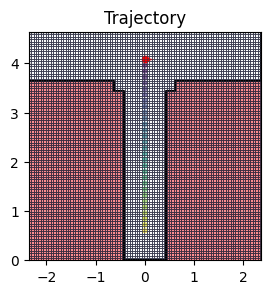

In [8]:
# Show trajectory overlaid on environment
task.show_data(
    show=True,
    overlay_movement_cost=True,  # Show accessible regions
    save_path=None
)

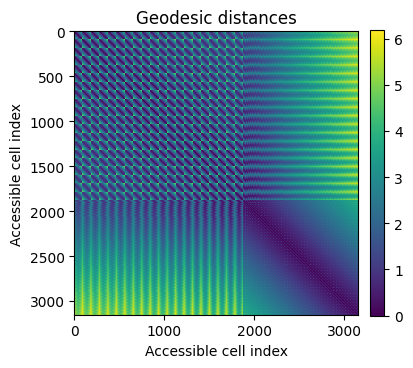

GeodesicDistanceResult(distances=array([[0.        , 0.05      , 0.1       , ..., 6.13700577, 6.15771645,
        6.17842712],
       [0.05      , 0.        , 0.05      , ..., 6.08700577, 6.10771645,
        6.12842712],
       [0.1       , 0.05      , 0.        , ..., 6.03700577, 6.05771645,
        6.07842712],
       ...,
       [6.13700577, 6.08700577, 6.03700577, ..., 0.        , 0.05      ,
        0.1       ],
       [6.15771645, 6.10771645, 6.05771645, ..., 0.05      , 0.        ,
        0.05      ],
       [6.17842712, 6.12842712, 6.07842712, ..., 0.1       , 0.05      ,
        0.        ]], shape=(3153, 3153)), accessible_indices=array([[ 0,  0],
       [ 0,  1],
       [ 0,  2],
       ...,
       [92, 53],
       [92, 54],
       [92, 55]], shape=(3153, 2)), cost_grid=MovementCostGrid(costs=array([[         1,          1,          1, ...,          1,          1,
        2147483647],
       [         1,          1,          1, ...,          1,          1,
        214748364

In [9]:
# Show geodesic distance heatmap
task.show_geodesic_distance_matrix(
    show=True,
    save_path=None
)

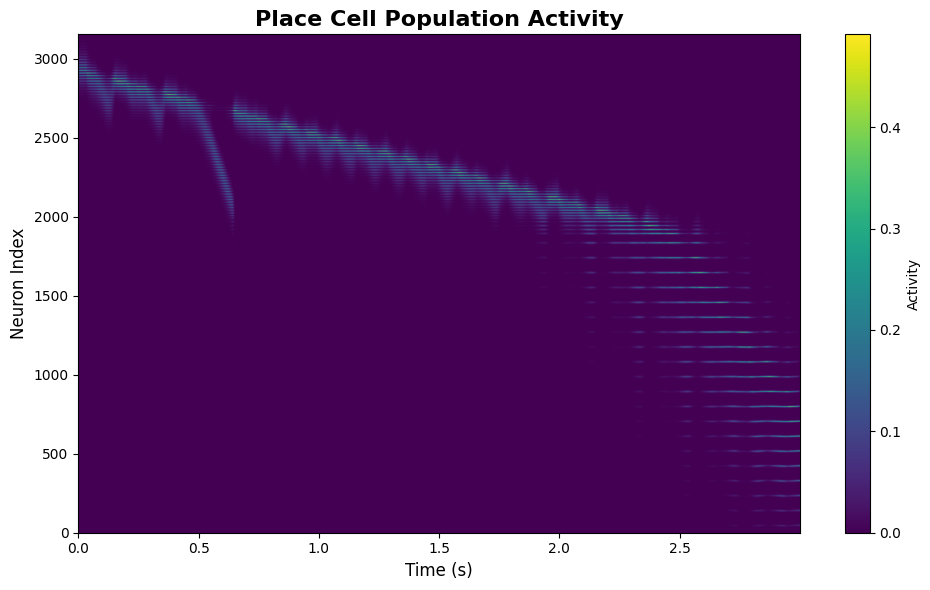

(<Figure size 1000x600 with 2 Axes>,
 <Axes: title={'center': 'Place Cell Population Activity'}, xlabel='Time (s)', ylabel='Neuron Index'>)

In [10]:
from canns.analyzer.plotting.spikes import population_activity_heatmap

# Create population activity heatmap
population_activity_heatmap(
    activity_data=net_activity,
    dt=dt,
    title="Place Cell Population Activity",
    figsize=(10, 6),
    cmap="viridis",
    save_path=None,
    show=True
)

In [11]:
from canns.analyzer.theta_sweep import create_theta_sweep_place_cell_animation

# Create animation (this may take time)
print("Creating theta sweep animation...")
create_theta_sweep_place_cell_animation(
    position_data=position,
    pc_activity_data=net_activity,
    pc_network=pc_net,
    navigation_task=task,
    n_step=20,              # Sample every 20 frames
    fps=10,                  # 10 frames per second
    figsize=(14, 5),
    show=True
)

Creating theta sweep animation...
